<a href="https://colab.research.google.com/github/sb2539/rc_car_tiny-yolov3/blob/main/darknet_rc_car_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#1. YOLO

In [ ]:
!wget https://pjreddie.com/media/files/yolov3-tiny.weights

--2021-09-28 09:40:38--  https://pjreddie.com/media/files/yolov3-tiny.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35434956 (34M) [application/octet-stream]
Saving to: ‘yolov3-tiny.weights’

yolov3-tiny.weights 100%[===================>]  33.79M  15.6MB/s    in 2.2s    

2021-09-28 09:40:41 (15.6 MB/s) - ‘yolov3-tiny.weights’ saved [35434956/35434956]



In [ ]:
!ls -al

total 16
drwxr-xr-x 1 root root 4096 Sep 16 13:40 .
drwxr-xr-x 1 root root 4096 Sep 29 14:11 ..
drwxr-xr-x 4 root root 4096 Sep 16 13:39 .config
drwxr-xr-x 1 root root 4096 Sep 16 13:40 sample_data


In [ ]:
# yolov3.cfg
# darknet
# tinyrc4.jpg
# coco.data
# coco.names
# label.zip
from google.colab import files
files.upload()

Saving coco.data to coco.data
Saving coco.names to coco.names
Saving darknet to darknet
Saving labels.zip to labels.zip
Saving rc30.jpg to rc30.jpg


{'coco.data': b'classes= 80\ntrain  = /home/pjreddie/data/coco/trainvalno5k.txt\nvalid  = coco_testdev\n#valid = data/coco_val_5k.list\nnames = data/coco.names\nbackup = /home/pjreddie/backup/\neval=coco\n\n',
 'coco.names': b'person\r\nbicycle\r\ncar\r\nmotorbike\r\naeroplane\r\nbus\r\ntrain\r\ntruck\r\nboat\r\ntraffic light\r\nfire hydrant\r\nstop sign\r\nparking meter\r\nbench\r\nbird\r\ncat\r\ndog\r\nhorse\r\nsheep\r\ncow\r\nelephant\r\nbear\r\nzebra\r\ngiraffe\r\nbackpack\r\numbrella\r\nhandbag\r\ntie\r\nsuitcase\r\nfrisbee\r\nskis\r\nsnowboard\r\nsports ball\r\nkite\r\nbaseball bat\r\nbaseball glove\r\nskateboard\r\nsurfboard\r\ntennis racket\r\nbottle\r\nwine glass\r\ncup\r\nfork\r\nknife\r\nspoon\r\nbowl\r\nbanana\r\napple\r\nsandwich\r\norange\r\nbroccoli\r\ncarrot\r\nhot dog\r\npizza\r\ndonut\r\ncake\r\nchair\r\nsofa\r\npottedplant\r\nbed\r\ndiningtable\r\ntoilet\r\ntvmonitor\r\nlaptop\r\nmouse\r\nremote\r\nkeyboard\r\ncell phone\r\nmicrowave\r\noven\r\ntoaster\r\nsink\r\nref

In [ ]:
!ls -al

total 3972
drwxr-xr-x 1 root root    4096 Sep 29 14:14 .
drwxr-xr-x 1 root root    4096 Sep 29 14:11 ..
-rw-r--r-- 1 root root     183 Sep 29 14:13 coco.data
-rw-r--r-- 1 root root     705 Sep 29 14:13 coco.names
drwxr-xr-x 4 root root    4096 Sep 16 13:39 .config
-rw-r--r-- 1 root root 3213624 Sep 29 14:14 darknet
-rw-r--r-- 1 root root  504496 Sep 29 14:14 labels.zip
-rw-r--r-- 1 root root  318732 Sep 29 14:14 rc30.jpg
drwxr-xr-x 1 root root    4096 Sep 16 13:40 sample_data


In [ ]:
!chmod +x ./darknet  # 다크넷 실행 가능하게 해주는 역할

In [ ]:
!mkdir cfg
!mkdir data

In [ ]:
!cp coco.data ./cfg/

In [ ]:
!cp coco.names ./data/

In [ ]:
!unzip labels.zip -d ./data/

Archive:  labels.zip
   creating: ./data/labels/
  inflating: ./data/labels/118_1.png  
  inflating: ./data/labels/105_4.png  
  inflating: ./data/labels/91_2.png  
  inflating: ./data/labels/123_7.png  
  inflating: ./data/labels/71_7.png  
  inflating: ./data/labels/34_7.png  
  inflating: ./data/labels/57_4.png  
  inflating: ./data/labels/48_3.png  
  inflating: ./data/labels/107_6.png  
  inflating: ./data/labels/121_5.png  
  inflating: ./data/labels/93_0.png  
  inflating: ./data/labels/36_5.png  
  inflating: ./data/labels/73_5.png  
  inflating: ./data/labels/55_6.png  
  inflating: ./data/labels/88_3.png  
  inflating: ./data/labels/68_6.png  
  inflating: ./data/labels/95_6.png  
  inflating: ./data/labels/101_0.png  
  inflating: ./data/labels/53_0.png  
  inflating: ./data/labels/75_3.png  
  inflating: ./data/labels/97_4.png  
  inflating: ./data/labels/125_1.png  
  inflating: ./data/labels/103_2.png  
  inflating: ./data/labels/51_2.png  
  inflating: ./data/labels/77_1

In [ ]:
!./darknet detect yolov3.cfg yolov3.weights rc1.jpg

layer     filters    size              input                output
   0 conv     32  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  32 0.639 BF
   1 conv     64  3 x 3 / 2   608 x 608 x  32   ->   304 x 304 x  64 3.407 BF
   2 conv     32  1 x 1 / 1   304 x 304 x  64   ->   304 x 304 x  32 0.379 BF
   3 conv     64  3 x 3 / 1   304 x 304 x  32   ->   304 x 304 x  64 3.407 BF
   4 Shortcut Layer: 1
   5 conv    128  3 x 3 / 2   304 x 304 x  64   ->   152 x 152 x 128 3.407 BF
   6 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64 0.379 BF
   7 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128 3.407 BF
   8 Shortcut Layer: 5
   9 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64 0.379 BF
  10 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128 3.407 BF
  11 Shortcut Layer: 8
  12 conv    256  3 x 3 / 2   152 x 152 x 128   ->    76 x  76 x 256 3.407 BF
  13 conv    128  1 x 1 / 1    76 x  76 x 256   ->    76 x  76 x 128 0.379 BF
  14 c

In [ ]:
!ls -al

total 3980
drwxr-xr-x 1 root root    4096 Sep 29 14:17 .
drwxr-xr-x 1 root root    4096 Sep 29 14:11 ..
drwxr-xr-x 2 root root    4096 Sep 29 14:17 cfg
-rw-r--r-- 1 root root     183 Sep 29 14:13 coco.data
-rw-r--r-- 1 root root     705 Sep 29 14:13 coco.names
drwxr-xr-x 4 root root    4096 Sep 16 13:39 .config
-rwxr-xr-x 1 root root 3213624 Sep 29 14:14 darknet
drwxr-xr-x 4 root root    4096 Sep 29 14:17 data
-rw-r--r-- 1 root root  504496 Sep 29 14:14 labels.zip
-rw-r--r-- 1 root root  318732 Sep 29 14:14 rc30.jpg
drwxr-xr-x 1 root root    4096 Sep 16 13:40 sample_data


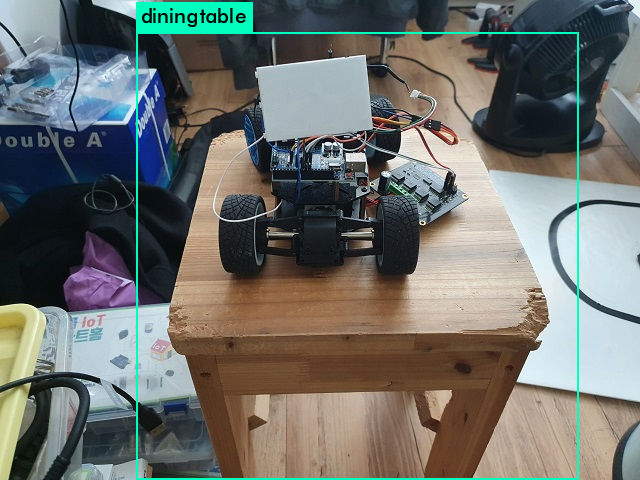

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('predictions.jpg')
cv2_imshow(img)

#2. custom yolo rc car

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
!ls -al '/gdrive/MyDrive/darknet/tinyrc'

total 20409
-rw------- 1 root root       7 Sep 29 14:11 classes.names
-rw------- 1 root root       8 Sep 29 12:46 classes.txt
-rw------- 1 root root     183 Jun 18 04:24 coco.data
-rw------- 1 root root     705 Jun 18 04:24 coco.names
-rw------- 1 root root 3213624 Jun 18 04:24 darknet
-rw------- 1 root root  504496 Jun 18 04:24 labels.zip
-rw------- 1 root root  350002 Sep 29 12:30 rc10.jpg
-rw------- 1 root root      38 Sep 29 12:38 rc10.txt
-rw------- 1 root root  387324 Sep 29 12:30 rc11.jpg
-rw------- 1 root root      38 Sep 29 12:38 rc11.txt
-rw------- 1 root root  359616 Sep 29 12:30 rc12.jpg
-rw------- 1 root root      38 Sep 29 12:38 rc12.txt
-rw------- 1 root root  368808 Sep 29 12:30 rc13.jpg
-rw------- 1 root root      38 Sep 29 12:38 rc13.txt
-rw------- 1 root root  373121 Sep 29 12:30 rc14.jpg
-rw------- 1 root root      38 Sep 29 12:39 rc14.txt
-rw------- 1 root root  383850 Sep 29 12:30 rc15.jpg
-rw------- 1 root root      38 Sep 29 12:39 rc15.txt
-rw------- 1 root root

In [ ]:
# Download Pretrained Convolutional Weight
!wget https://pjreddie.com/media/files/darknet53.conv.74

--2021-09-25 12:49:24--  https://pjreddie.com/media/files/darknet53.conv.74
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 162482580 (155M) [application/octet-stream]
Saving to: ‘darknet53.conv.74’

darknet53.conv.74   100%[===================>] 154.96M   103MB/s    in 1.5s    

2021-09-25 12:49:25 (103 MB/s) - ‘darknet53.conv.74’ saved [162482580/162482580]



In [ ]:
!ls -al

total 3988
drwxr-xr-x 1 root root    4096 Sep 29 14:22 .
drwxr-xr-x 1 root root    4096 Sep 29 14:17 ..
drwxr-xr-x 2 root root    4096 Sep 29 14:22 backup
drwxr-xr-x 2 root root    4096 Sep 29 14:17 cfg
-rw-r--r-- 1 root root     183 Sep 29 14:13 coco.data
-rw-r--r-- 1 root root     705 Sep 29 14:13 coco.names
drwxr-xr-x 4 root root    4096 Sep 16 13:39 .config
-rwxr-xr-x 1 root root 3213624 Sep 29 14:14 darknet
drwxr-xr-x 4 root root    4096 Sep 29 14:17 data
-rw-r--r-- 1 root root  504496 Sep 29 14:14 labels.zip
-rw-r--r-- 1 root root  318732 Sep 29 14:14 rc30.jpg
drwxr-xr-x 1 root root    4096 Sep 16 13:40 sample_data
drwx------ 2 root root    4096 Sep 29 14:19 tinyrc


In [ ]:
!cp -r '/gdrive/MyDrive/darknet/tinyrc' .

In [ ]:
!mkdir backup

In [ ]:
!ls -al 

total 3988
drwxr-xr-x 1 root root    4096 Sep 29 14:22 .
drwxr-xr-x 1 root root    4096 Sep 29 14:17 ..
drwxr-xr-x 2 root root    4096 Sep 29 14:22 backup
drwxr-xr-x 2 root root    4096 Sep 29 14:17 cfg
-rw-r--r-- 1 root root     183 Sep 29 14:13 coco.data
-rw-r--r-- 1 root root     705 Sep 29 14:13 coco.names
drwxr-xr-x 4 root root    4096 Sep 16 13:39 .config
-rwxr-xr-x 1 root root 3213624 Sep 29 14:14 darknet
drwxr-xr-x 4 root root    4096 Sep 29 14:17 data
-rw-r--r-- 1 root root  504496 Sep 29 14:14 labels.zip
-rw-r--r-- 1 root root  318732 Sep 29 14:14 rc30.jpg
drwxr-xr-x 1 root root    4096 Sep 16 13:40 sample_data
drwx------ 2 root root    4096 Sep 29 14:19 tinyrc


In [ ]:
!ls -al '/gdrive/MyDrive/darknet/tinyrc'

total 55014
-rw------- 1 root root        7 Sep 29 14:11 classes.names
-rw------- 1 root root        8 Sep 29 12:46 classes.txt
-rw------- 1 root root      183 Jun 18 04:24 coco.data
-rw------- 1 root root      705 Jun 18 04:24 coco.names
-rw------- 1 root root  3213624 Jun 18 04:24 darknet
-rw------- 1 root root   504496 Jun 18 04:24 labels.zip
-rw------- 1 root root   350002 Sep 29 12:30 rc10.jpg
-rw------- 1 root root       38 Sep 29 12:38 rc10.txt
-rw------- 1 root root   387324 Sep 29 12:30 rc11.jpg
-rw------- 1 root root       38 Sep 29 12:38 rc11.txt
-rw------- 1 root root   359616 Sep 29 12:30 rc12.jpg
-rw------- 1 root root       38 Sep 29 12:38 rc12.txt
-rw------- 1 root root   368808 Sep 29 12:30 rc13.jpg
-rw------- 1 root root       38 Sep 29 12:38 rc13.txt
-rw------- 1 root root   373121 Sep 29 12:30 rc14.jpg
-rw------- 1 root root       38 Sep 29 12:39 rc14.txt
-rw------- 1 root root   383850 Sep 29 12:30 rc15.jpg
-rw------- 1 root root       38 Sep 29 12:39 rc15.txt
-rw-

In [ ]:
!./darknet partial tinyrc/tinyrc.cfg tinyrc/yolov3-tiny.weights yolov3-tiny.conv.15 15

layer     filters    size              input                output
   0 conv     16  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  16 0.150 BF
   1 max          2 x 2 / 2   416 x 416 x  16   ->   208 x 208 x  16 0.003 BF
   2 conv     32  3 x 3 / 1   208 x 208 x  16   ->   208 x 208 x  32 0.399 BF
   3 max          2 x 2 / 2   208 x 208 x  32   ->   104 x 104 x  32 0.001 BF
   4 conv     64  3 x 3 / 1   104 x 104 x  32   ->   104 x 104 x  64 0.399 BF
   5 max          2 x 2 / 2   104 x 104 x  64   ->    52 x  52 x  64 0.001 BF
   6 conv    128  3 x 3 / 1    52 x  52 x  64   ->    52 x  52 x 128 0.399 BF
   7 max          2 x 2 / 2    52 x  52 x 128   ->    26 x  26 x 128 0.000 BF
   8 conv    256  3 x 3 / 1    26 x  26 x 128   ->    26 x  26 x 256 0.399 BF
   9 max          2 x 2 / 2    26 x  26 x 256   ->    13 x  13 x 256 0.000 BF
  10 conv    512  3 x 3 / 1    13 x  13 x 256   ->    13 x  13 x 512 0.399 BF
  11 max          2 x 2 / 1    13 x  13 x 512   ->    13 x  13 x 512 0.000 

In [ ]:
!ls -al

total 34236
drwxr-xr-x 1 root root     4096 Sep 29 14:29 .
drwxr-xr-x 1 root root     4096 Sep 29 14:17 ..
drwxr-xr-x 2 root root     4096 Sep 29 14:22 backup
drwxr-xr-x 2 root root     4096 Sep 29 14:17 cfg
-rw-r--r-- 1 root root      183 Sep 29 14:13 coco.data
-rw-r--r-- 1 root root      705 Sep 29 14:13 coco.names
drwxr-xr-x 4 root root     4096 Sep 16 13:39 .config
-rwxr-xr-x 1 root root  3213624 Sep 29 14:14 darknet
drwxr-xr-x 4 root root     4096 Sep 29 14:17 data
-rw-r--r-- 1 root root   504496 Sep 29 14:14 labels.zip
-rw-r--r-- 1 root root   318732 Sep 29 14:14 rc30.jpg
drwxr-xr-x 1 root root     4096 Sep 16 13:40 sample_data
drwx------ 2 root root     4096 Sep 29 14:26 tinyrc
-rw-r--r-- 1 root root 30973396 Sep 29 14:29 yolov3-tiny.conv.15


In [ ]:
!ls -al '/gdrive/MyDrive/darknet/customtinyrc'

total 40654
-rw------- 1 root root        7 Sep 28 09:12 classes.names
-rw------- 1 root root        8 Sep 28 04:25 classes.txt
-rw------- 1 root root      183 Jun 18 04:24 coco.data
-rw------- 1 root root      705 Jun 18 04:24 coco.names
-rw------- 1 root root  3213624 Jun 18 04:24 darknet
-rw------- 1 root root   504496 Jun 18 04:24 labels.zip
-rw------- 1 root root      196 Sep 28 09:12 test.txt
-rw------- 1 root root   141817 Sep 28 04:15 tinyrc10.jpg
-rw------- 1 root root       38 Sep 28 04:23 tinyrc10.txt
-rw------- 1 root root   128238 Sep 28 04:16 tinyrc11.jpg
-rw------- 1 root root       38 Sep 28 04:24 tinyrc11.txt
-rw------- 1 root root   114236 Sep 28 04:16 tinyrc12.jpg
-rw------- 1 root root       38 Sep 28 04:24 tinyrc12.txt
-rw------- 1 root root   117591 Sep 28 04:16 tinyrc13.jpg
-rw------- 1 root root       38 Sep 28 04:24 tinyrc13.txt
-rw------- 1 root root   114990 Sep 28 04:16 tinyrc14.jpg
-rw------- 1 root root       38 Sep 28 04:24 tinyrc14.txt
-rw------- 1 root 

#3. train rc car yolo

In [ ]:
# Train the Model
!./darknet detector train tinyrc/tiny_rc_data.data tinyrc/tinyrc.cfg yolov3-tiny.conv.15 -dont_show


 1281: 0.230887, 0.232031 avg loss, 0.001000 rate, 0.551442 seconds, 81984 images
Loaded: 0.807710 seconds

 1282: 0.246845, 0.233512 avg loss, 0.001000 rate, 0.539181 seconds, 82048 images
Loaded: 0.839737 seconds

 1283: 0.263282, 0.236489 avg loss, 0.001000 rate, 0.551011 seconds, 82112 images
Loaded: 0.837473 seconds

 1284: 0.240437, 0.236884 avg loss, 0.001000 rate, 0.530783 seconds, 82176 images
Loaded: 0.848079 seconds

 1285: 0.292587, 0.242454 avg loss, 0.001000 rate, 0.537395 seconds, 82240 images
Loaded: 0.861603 seconds

 1286: 0.302508, 0.248460 avg loss, 0.001000 rate, 0.536464 seconds, 82304 images
Loaded: 0.819215 seconds

 1287: 0.244473, 0.248061 avg loss, 0.001000 rate, 0.552701 seconds, 82368 images
Loaded: 0.794754 seconds

 1288: 0.266760, 0.249931 avg loss, 0.001000 rate, 0.551111 seconds, 82432 images
Loaded: 0.802928 seconds

 1289: 0.220283, 0.246966 avg loss, 0.001000 rate, 0.528442 seconds, 82496 images
Loaded: 0.863310 seconds

 1290: 0.242830, 0.246553 a

In [ ]:
!./darknet detector map tinyrc/tiny_rc_data.data tinyrc/tinyrc.cfg backup/tinyrc_last.weights

layer     filters    size              input                output
   0 conv     16  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  16 0.150 BF
   1 max          2 x 2 / 2   416 x 416 x  16   ->   208 x 208 x  16 0.003 BF
   2 conv     32  3 x 3 / 1   208 x 208 x  16   ->   208 x 208 x  32 0.399 BF
   3 max          2 x 2 / 2   208 x 208 x  32   ->   104 x 104 x  32 0.001 BF
   4 conv     64  3 x 3 / 1   104 x 104 x  32   ->   104 x 104 x  64 0.399 BF
   5 max          2 x 2 / 2   104 x 104 x  64   ->    52 x  52 x  64 0.001 BF
   6 conv    128  3 x 3 / 1    52 x  52 x  64   ->    52 x  52 x 128 0.399 BF
   7 max          2 x 2 / 2    52 x  52 x 128   ->    26 x  26 x 128 0.000 BF
   8 conv    256  3 x 3 / 1    26 x  26 x 128   ->    26 x  26 x 256 0.399 BF
   9 max          2 x 2 / 2    26 x  26 x 256   ->    13 x  13 x 256 0.000 BF
  10 conv    512  3 x 3 / 1    13 x  13 x 256   ->    13 x  13 x 512 0.399 BF
  11 max          2 x 2 / 1    13 x  13 x 512   ->    13 x  13 x 512 0.000 

In [ ]:
!./darknet detector map tinyrc/tiny_rc_data.data tinyrc/tinyrc.cfg backup/tinyrc_final.weights

layer     filters    size              input                output
   0 conv     16  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  16 0.150 BF
   1 max          2 x 2 / 2   416 x 416 x  16   ->   208 x 208 x  16 0.003 BF
   2 conv     32  3 x 3 / 1   208 x 208 x  16   ->   208 x 208 x  32 0.399 BF
   3 max          2 x 2 / 2   208 x 208 x  32   ->   104 x 104 x  32 0.001 BF
   4 conv     64  3 x 3 / 1   104 x 104 x  32   ->   104 x 104 x  64 0.399 BF
   5 max          2 x 2 / 2   104 x 104 x  64   ->    52 x  52 x  64 0.001 BF
   6 conv    128  3 x 3 / 1    52 x  52 x  64   ->    52 x  52 x 128 0.399 BF
   7 max          2 x 2 / 2    52 x  52 x 128   ->    26 x  26 x 128 0.000 BF
   8 conv    256  3 x 3 / 1    26 x  26 x 128   ->    26 x  26 x 256 0.399 BF
   9 max          2 x 2 / 2    26 x  26 x 256   ->    13 x  13 x 256 0.000 BF
  10 conv    512  3 x 3 / 1    13 x  13 x 256   ->    13 x  13 x 512 0.399 BF
  11 max          2 x 2 / 1    13 x  13 x 512   ->    13 x  13 x 512 0.000 

In [ ]:
!./darknet detector map tinyrc/tiny_rc_data.data tinyrc/tinyrc.cfg backup/tinyrc_1000.weights

layer     filters    size              input                output
   0 conv     16  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  16 0.150 BF
   1 max          2 x 2 / 2   416 x 416 x  16   ->   208 x 208 x  16 0.003 BF
   2 conv     32  3 x 3 / 1   208 x 208 x  16   ->   208 x 208 x  32 0.399 BF
   3 max          2 x 2 / 2   208 x 208 x  32   ->   104 x 104 x  32 0.001 BF
   4 conv     64  3 x 3 / 1   104 x 104 x  32   ->   104 x 104 x  64 0.399 BF
   5 max          2 x 2 / 2   104 x 104 x  64   ->    52 x  52 x  64 0.001 BF
   6 conv    128  3 x 3 / 1    52 x  52 x  64   ->    52 x  52 x 128 0.399 BF
   7 max          2 x 2 / 2    52 x  52 x 128   ->    26 x  26 x 128 0.000 BF
   8 conv    256  3 x 3 / 1    26 x  26 x 128   ->    26 x  26 x 256 0.399 BF
   9 max          2 x 2 / 2    26 x  26 x 256   ->    13 x  13 x 256 0.000 BF
  10 conv    512  3 x 3 / 1    13 x  13 x 256   ->    13 x  13 x 512 0.399 BF
  11 max          2 x 2 / 1    13 x  13 x 512   ->    13 x  13 x 512 0.000 

In [ ]:
!./darknet detector map customrc/custom_rc_data.data customrc/rc-train-yolo.cfg backup/rc-train-yolo_1000.weights

In [ ]:
!ls -al ./backup

total 135576
drwxr-xr-x 2 root root     4096 Sep 29 15:18 .
drwxr-xr-x 1 root root     4096 Sep 29 14:32 ..
-rw-r--r-- 1 root root 34704996 Sep 29 14:53 tinyrc_1000.weights
-rw-r--r-- 1 root root 34704996 Sep 29 15:18 tinyrc_2000.weights
-rw-r--r-- 1 root root 34704996 Sep 29 15:18 tinyrc_final.weights
-rw-r--r-- 1 root root 34704996 Sep 29 15:18 tinyrc_last.weights


In [ ]:
!./darknet detector test tinyrc/tiny_rc_data.data tinyrc/tinyrc.cfg backup/tinyrc_final.weights rc30.jpg

layer     filters    size              input                output
   0 conv     16  3 x 3 / 1   416 x 416 x   3   ->   416 x 416 x  16 0.150 BF
   1 max          2 x 2 / 2   416 x 416 x  16   ->   208 x 208 x  16 0.003 BF
   2 conv     32  3 x 3 / 1   208 x 208 x  16   ->   208 x 208 x  32 0.399 BF
   3 max          2 x 2 / 2   208 x 208 x  32   ->   104 x 104 x  32 0.001 BF
   4 conv     64  3 x 3 / 1   104 x 104 x  32   ->   104 x 104 x  64 0.399 BF
   5 max          2 x 2 / 2   104 x 104 x  64   ->    52 x  52 x  64 0.001 BF
   6 conv    128  3 x 3 / 1    52 x  52 x  64   ->    52 x  52 x 128 0.399 BF
   7 max          2 x 2 / 2    52 x  52 x 128   ->    26 x  26 x 128 0.000 BF
   8 conv    256  3 x 3 / 1    26 x  26 x 128   ->    26 x  26 x 256 0.399 BF
   9 max          2 x 2 / 2    26 x  26 x 256   ->    13 x  13 x 256 0.000 BF
  10 conv    512  3 x 3 / 1    13 x  13 x 256   ->    13 x  13 x 512 0.399 BF
  11 max          2 x 2 / 1    13 x  13 x 512   ->    13 x  13 x 512 0.000 

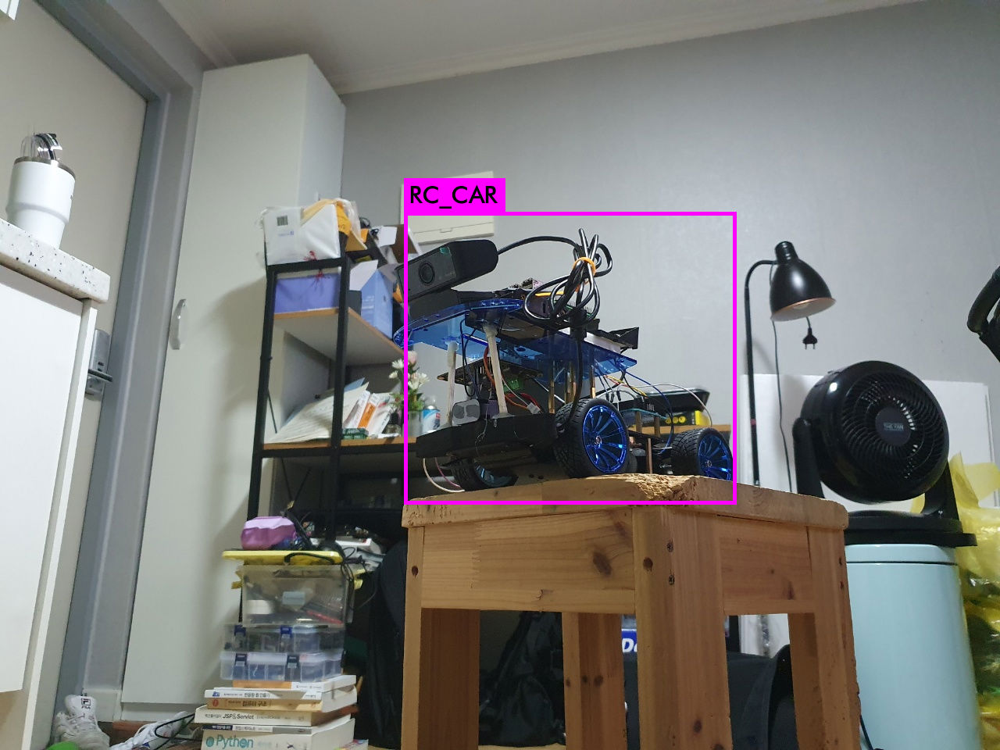

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('predictions.jpg')
cv2_imshow(img)

In [ ]:
!cp -r ./backup/tinyrc_final.weights '/gdrive/My Drive/darknet/tinyyolorc.weights'